In [1]:
print ("hola")

hola


In [1]:
import streamlit as st
from pdf2image import convert_from_bytes
import pytesseract
import re
import json
import ollama
import pandas as pd


1. Este

In [ ]:
from pdf2image import convert_from_bytes
import pytesseract
import re
import json
import ollama
import os
import cv2
import numpy as np

PATH_POPPLER = r"C:\poppler-26.07.0\Library\bin"

# ==========================================
# CONFIGURACIÓN WINDOWS
# ==========================================
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'

# Asegura la ruta directa hacia tessdata
tessdata_dir = r"C:\Program Files\Tesseract-OCR\tessdata"
os.environ["TESSDATA_PREFIX"] = tessdata_dir

def extraer_imagenes_pdf(file_bytes):
    """Convierte los bytes del PDF en una lista de imágenes en memoria."""
    return convert_from_bytes(file_bytes, poppler_path=PATH_POPPLER)

# ==========================================
# NUEVO: LIMPIEZA MATEMÁTICA CON OPENCV
# ==========================================
def limpiar_imagen_opencv(imagen_pil):
    """Mejora drásticamente el contraste para que Tesseract no falle."""
    # 1. Convertir la imagen PIL a formato OpenCV (Matriz NumPy)
    img_cv = cv2.cvtColor(np.array(imagen_pil), cv2.COLOR_RGB2BGR)
    
    # 2. Convertir a escala de grises
    gris = cv2.cvtColor(img_cv, cv2.COLOR_BGR2GRAY)
    
    # 3. Eliminar ruido y suavizar la imagen (filtro Gaussiano)
    desenfocado = cv2.GaussianBlur(gris, (5, 5), 0)
    
    # 4. Binarización Adaptativa: Vuelve el fondo blanco puro y la tinta negra pura
    binarizada = cv2.adaptiveThreshold(
        desenfocado, 255, 
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY, 11, 2
    )
    return binarizada

def aplicar_ocr(imagen):
    """Extrae el texto limpiando la imagen primero."""
    # 1. Pasamos la imagen por el filtro de OpenCV
    imagen_limpia = limpiar_imagen_opencv(imagen)
    
    # 2. Tesseract lee directamente la imagen procesada
    # config='--psm 3' ayuda a Tesseract a entender que es un documento estructurado
    texto = pytesseract.image_to_string(imagen_limpia, lang='spa', config='--psm 3')
    
    return texto

def agrupar_documentos_logicos(textos_paginas):
    """
    Recibe una lista de textos (páginas) y usa heurística para 
    agrupar las hojas que pertenecen a la misma factura/proforma.
    """
    patron_inicio = r"(FACTURA\s*N[°o]?\s*\d|PROFORMA\s*N[°o]?\s*\d|RUC\s*DEL\s*EMISOR)"
    documentos_agrupados = []
    doc_actual = ""
    
    for texto in textos_paginas:
        if re.search(patron_inicio, texto, re.IGNORECASE) and doc_actual != "":
            documentos_agrupados.append(doc_actual)
            doc_actual = texto 
        else:
            doc_actual += "\n" + texto
            
    if doc_actual:
        documentos_agrupados.append(doc_actual)
        
    return documentos_agrupados

def extraer_entidades_ia(texto_factura):
    """
    Envía el bloque de texto agrupado a Ollama local y devuelve un JSON.
    """
    prompt = f"""
    Eres un experto en extraer datos de facturas ecuatorianas.
    Analiza el texto de esta factura de vehículos y extrae estos campos:
    - marca: Marca del vehículo (ej. BYD, Tesla, Kia, Chery).
    - modelo: Modelo específico del vehículo.
    - cantidad: Número de vehículos comprados (entero).
    - beneficiario: Nombre completo o razón social del cliente.
    - ci: Número de cédula o RUC del comprador.

    Devuelve ÚNICAMENTE un objeto JSON. Si no encuentras un dato, usa null.
    
    TEXTO:
    {texto_factura}
    """
    
    try:
        response = ollama.chat(
            model='qwen2.5:3b', 
            format='json',
            messages=[{'role': 'user', 'content': prompt}],
            options={'temperature': 0.0} 
        )
        return json.loads(response['message']['content'])
    except Exception as e:
        return {
            "marca": None, "modelo": None, "cantidad": None, 
            "beneficiario": "Error de parseo", "ci": None, "error_log": str(e)
        }

In [2]:
from pdf2image import convert_from_bytes
import pytesseract
import re
import json
import ollama
import os
import pytesseract

PATH_POPPLER = r"C:\poppler-26.07.0\Library\bin"

# ==========================================
# CONFIGURACIÓN WINDOWS (Si es necesario)*
# ==========================================
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'


# Asegura la ruta directa hacia tessdata
tessdata_dir = r"C:\Program Files\Tesseract-OCR\tessdata"
os.environ["TESSDATA_PREFIX"] = tessdata_dir

def extraer_imagenes_pdf(file_bytes):
    """Convierte los bytes del PDF en una lista de imágenes en memoria."""
    # En Windows puede que necesites añadir: poppler_path=r'C:\poppler\Library\bin'
    return convert_from_bytes(file_bytes, poppler_path=PATH_POPPLER)

def aplicar_ocr(imagen):
    """Extrae el texto de una sola imagen usando Tesseract en español."""
    return pytesseract.image_to_string(imagen, lang='spa')

def agrupar_documentos_logicos(textos_paginas):
    """
    Recibe una lista de textos (páginas) y usa heurística para 
    agrupar las hojas que pertenecen a la misma factura/proforma.
    """
    patron_inicio = r"(FACTURA\s*N[°o]?\s*\d|PROFORMA\s*N[°o]?\s*\d|RUC\s*DEL\s*EMISOR)"
    documentos_agrupados = []
    doc_actual = ""
    
    for texto in textos_paginas:
        if re.search(patron_inicio, texto, re.IGNORECASE) and doc_actual != "":
            documentos_agrupados.append(doc_actual)
            doc_actual = texto 
        else:
            doc_actual += "\n" + texto
            
    if doc_actual:
        documentos_agrupados.append(doc_actual)
        
    return documentos_agrupados

def extraer_entidades_ia(texto_factura):
    """
    Envía el bloque de texto agrupado a Ollama local y devuelve un JSON.
    """
    prompt = f"""
    Eres un experto en extraer datos de facturas ecuatorianas.
    Analiza el texto de esta factura de vehículos y extrae estos campos:
    - marca: Marca del vehículo (ej. BYD, Tesla, Kia, Chery).
    - modelo: Modelo específico del vehículo.
    - cantidad: Número de vehículos comprados (entero).
    - beneficiario: Nombre completo o razón social del cliente.
    - ci: Número de cédula o RUC del comprador.

    Devuelve ÚNICAMENTE un objeto JSON. Si no encuentras un dato, usa null.
    
    TEXTO:
    {texto_factura}
    """
    
    try:
        response = ollama.chat(
            model='qwen2.5:3b', 
            format='json',
            messages=[{'role': 'user', 'content': prompt}],
            options={'temperature': 0.0} 
        )
        return json.loads(response['message']['content'])
    except Exception as e:
        return {
            "marca": None, "modelo": None, "cantidad": None, 
            "beneficiario": "Error de parseo", "ci": None, "error_log": str(e)
        }

In [5]:
path ="docs/proforma_vehiculo_electrico_ecuador_letra_escrita.pdf"

In [6]:
imagenes = extraer_imagenes_pdf(open(path, "rb").read())

In [2]:
from PIL import Image

# 1. Definir la ruta (usa 'r' antes de las comillas en Windows para evitar problemas con las barras \)
ruta_imagen = "docs/fac.png"

# 2. Abrir la imagen
imagenes = [Image.open(ruta_imagen)]

# 3. (Opcional) Visualizarla o verificar sus datos

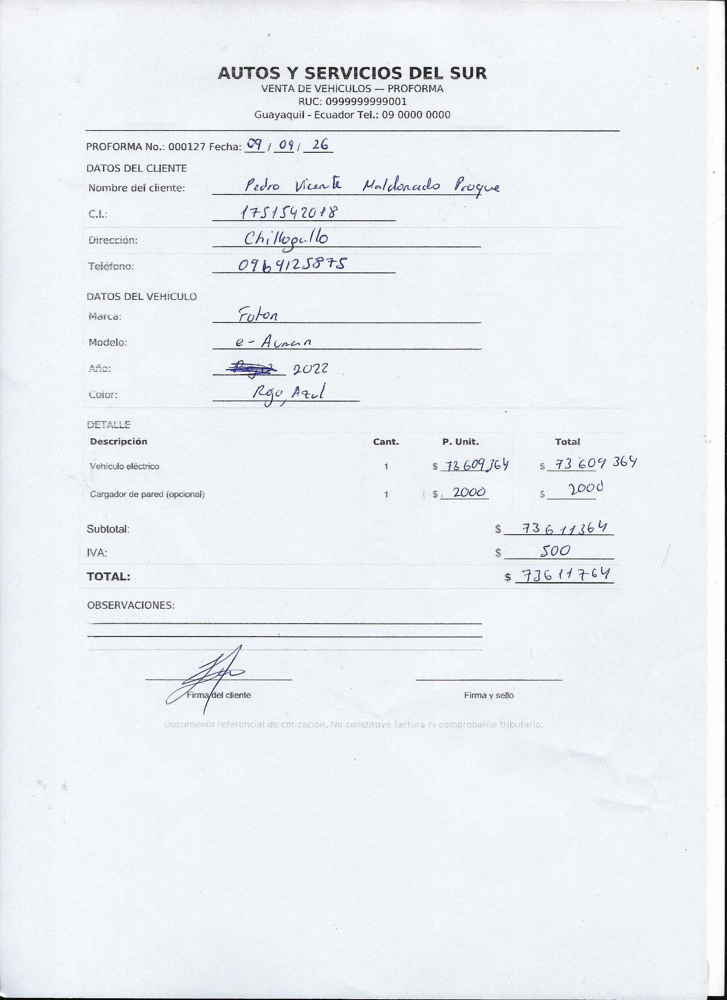

In [3]:
display(imagenes[0])  # Muestra la primera página como ejemplo

_______

In [9]:
import base64
from io import BytesIO
import json
import ollama

def extraer_con_llama_vision(imagen_pil):
    # Convertimos la imagen a base64
    buffered = BytesIO()
    imagen_pil.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    
    prompt = """
    Eres un auditor financiero experto. Analiza la imagen de esta factura/proforma.
    Extrae los siguientes datos exactos. Si el documento está escrito a mano, esfuérzate por leer la caligrafía.
    
    Devuelve ÚNICAMENTE este formato JSON. No escribas saludos, ni explicaciones, solo el JSON:
    {
        "marca": "marca del auto o null",
        "modelo": "modelo del auto o null",
        "cantidad": 1,
        "beneficiario": "nombre del cliente o null",
        "ci": "cédula, RUC o null"
    }
    """
    
    try:
       # Usamos LLaVA en lugar de Llama 3.2
        response = ollama.chat(
            model='llava:7b', 
            messages=[{
                'role': 'user', 
                'content': prompt,
                'images': [img_str]
            }],
            options={'temperature': 0.0, 'num_predict': 150} 
        )
        
        contenido = response['message']['content'].strip()
        
        # Limpieza de bloques markdown
        if contenido.startswith("```"):
            contenido = contenido.replace("```json", "").replace("```", "").strip()
            
        return json.loads(contenido)
        
    except json.JSONDecodeError:
        return {"error": "El modelo falló al estructurar el JSON", "raw": contenido[:200]}
    except Exception as e:
        return {"error": str(e)}

In [10]:
res = extraer_con_llama_vision(imagenes[0])

In [11]:
res

{'marca': 'Ford',
 'modelo': 'Fiesta',
 'cantidad': 1,
 'beneficiario': 'Juan Pérez',
 'ci': '123456789'}

Alucino pero como un campeon

____

2. Puede ser

In [1]:
pip install opencv-python python-doctr[torch] numpy

     ---------------------------------------- 0.0/981.5 kB ? eta -:--:--
     ---------------------------------------- 981.5/981.5 kB 12.3 MB/s  0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
   ---------------------------------------- 0.0/44.0 MB ? eta -:--:--
   ----- ---------------------------------- 6.3/44.0 MB 30.4 MB/s eta 0:00:02
   ------------- -------------------------- 14.7/44.0 MB 35.4 MB/s eta 0:00:01
   --------------- ------------------------ 17.0/44.0 MB 28.5 MB/s eta 0:00:01
   ------------------ --------------------- 19.9/44.0 MB 25.8 MB/s eta 0:00:01
   -------------------- ------------------- 22.0/44.0 MB 21.5 MB/s eta 0:00:02
   ---------------------- ----------------- 24.4/44.0

In [6]:
import cv2
import numpy as np
from doctr.io import DocumentFile
from doctr.models import ocr_predictor
import ollama
import json

# Inicializamos DocTR (Descargará un modelo de red neuronal la primera vez)
# Usamos un modelo pesado y preciso que corre muy bien en local
modelo_doctr = ocr_predictor(det_arch='db_resnet50', reco_arch='crnn_vgg16_bn', pretrained=True)

def limpiar_imagen_opencv(imagen_pil):
    """
    Aplica visión artificial para limpiar sombras, manchas y mejorar caligrafía.
    Esta función es la diferencia entre que la IA lea el número de CI bien o mal.
    """
    # 1. Convertir de PIL a formato OpenCV
    img_cv = cv2.cvtColor(np.array(imagen_pil), cv2.COLOR_RGB2BGR)
    
    # 2. Convertir a escala de grises
    gris = cv2.cvtColor(img_cv, cv2.COLOR_BGR2GRAY)
    
    # 3. Eliminar ruido (filtro Gaussiano)
    desenfocado = cv2.GaussianBlur(gris, (5, 5), 0)
    
    # 4. Binarización Adaptativa (Fuerza el blanco/negro perfecto sin importar las sombras del escáner)
    binarizada = cv2.adaptiveThreshold(
        desenfocado, 255, 
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY, 11, 2
    )
    return binarizada

def extraer_texto_alta_precision(imagen_pil):
    """Usa DocTR sobre la imagen matemáticamente limpia."""
    
    # 1. Limpiamos la imagen (esto devuelve un numpy array de OpenCV)
    imagen_limpia = limpiar_imagen_opencv(imagen_pil)
    
    # 2. Convertimos el array de OpenCV a bytes (formato PNG en memoria RAM)
    exito, buffer_imagen = cv2.imencode('.png', imagen_limpia)
    if not exito:
        return "Error al codificar la imagen limpia"
    
    imagen_bytes = buffer_imagen.tobytes()
    
    # 3. Pasamos los bytes a DocTR (DocTR ahora sí reconocerá el formato)
    doc = DocumentFile.from_images(imagen_bytes)
    resultado = modelo_doctr(doc)
    
    # 4. Extraemos el texto respetando bloques y párrafos de la factura
    texto_completo = ""
    for page in resultado.pages:
        for block in page.blocks:
            for line in block.lines:
                palabras = [word.value for word in line.words]
                texto_completo += " ".join(palabras) + "\n"
            texto_completo += "\n" # Salto de línea entre bloques 
            
    return texto_completo.strip()

def estructurar_datos_finales(texto_perfecto):
    """Le pasa el texto ordenado a Ollama para que construya el JSON final."""
    
    prompt = f"""
    Extrae los datos de esta proforma/factura. 
    Presta mucha atención al número de CI, debe tener entre 10 y 13 dígitos.
    
    Devuelve ÚNICAMENTE formato JSON:
    {{
        "marca": "valor",
        "modelo": "valor",
        "cantidad": 1,
        "beneficiario": "valor",
        "ci": "valor"
    }}
    
    TEXTO:
    {texto_perfecto}
    """
    
    try:
        response = ollama.chat(
            model='qwen2.5:3b', 
            format='json',
            messages=[{'role': 'user', 'content': prompt}],
            options={'temperature': 0.0} 
        )
        return json.loads(response['message']['content'])
    except Exception as e:
        return {"error": "Fallo en estructuración", "detalle": str(e)}

In [7]:
res =  extraer_texto_alta_precision(imagenes[0])

_______

In [8]:
res

'AUTOSY SERVICIOS DEL SUR\nVENTA DE VEHICULOS - PROFORMA:\nRUC: 0999999999001\nGuayaquil - Ecuador Tel.: 09 0000 0000\ni\nPROFORMA No.: 000127 Fecha: 0911097 26\nDATOS DEL CLIENTE\nNombre del ciiente:\nPedro Venk Maldonado Progie\nC.I:\n1754542048\nDireccion:\nChillopallo\nTeléfono:\n096912587S\nDATOS DEL VEHICULO\nf Marca:\nFolon\n:: Modelo:\n21 Ainain\nAno:\n2022\nColur:\nRgor Atil\nDETALLE\nDescripcion\nCant.\nP. Unit.\nTotal\nVehlculo eléctrico\nS\n:)\nS73609364\n73609369\n:\nCargador de pared (opcional)\ni:s 2000\n2000\nSubtotal:\n$ 73611364\nIVA:\n$\nSOo\nTOTAL:\n$ 73674764\nOBSERVACIONES:\nS\nFirma/del cliente\nFirmayselio\nDocumento referencial de cotizacion.No canstiluve factura ni comprobante tributario.'

In [9]:
estructurar_datos_finales(res)

{'marca': 'Folon',
 'modelo': '21 Ainain',
 'cantidad': 1,
 'beneficiario': 'Pedro Venk Maldonado Progie',
 'ci': '1754542048'}

______________

3. Funciona bien 

In [7]:
import base64
from io import BytesIO
import json
import ollama

def extraer_con_maxima_precision(imagen_pil):
    """
    Envía la imagen cruda al modelo MiniCPM-V, el motor de comprensión de documentos 
    más potente actualmente disponible para ejecución local.
    """
    # Convertir la imagen a Base64 para enviarla a Ollama
    buffered = BytesIO()
    imagen_pil.save(buffered, format="PNG", quality=95)
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    
    # Prompt de extracción estricta
    prompt = """
    Eres el mejor auditor de documentos. Analiza la imagen de esta factura/proforma.
    Lee cuidadosamente cualquier texto escrito a mano (caligrafía) y extrae los datos.
    El número de CI (Cédula) debe tener 10 dígitos o el RUC 13 dígitos.
    
    Devuelve ÚNICAMENTE este formato JSON estricto sin usar bloques de código markdown:
    {
        "marca": "valor o null",
        "modelo": "valor o null",
        "cantidad": 1,
        "beneficiario": "valor o null",
        "ci": "valor o null"
    }
    """
    
    try:
        # Llamamos a MiniCPM-V
        response = ollama.chat(
            model='minicpm-v', 
            messages=[{
                'role': 'user', 
                'content': prompt,
                'images': [img_str]
            }],
            options={'temperature': 0.0} # Modo determinista para máxima precisión
        )
        
        contenido = response['message']['content'].strip()
        
        # Limpiar posibles residuos de markdown
        if contenido.startswith("```"):
            contenido = contenido.replace("```json", "").replace("```", "").strip()
            
        return json.loads(contenido)
        
    except json.JSONDecodeError:
        return {"error": "Fallo al armar JSON", "raw": contenido}
    except Exception as e:
        return {"error": str(e)}

In [8]:
res = extraer_con_maxima_precision(imagenes[0])

In [9]:
res

{'marca': 'Foton',
 'modelo': 'E-Aruna',
 'ano': '2022',
 'color': 'Rgo, Azul',
 'cant': 1,
 'beneficiario': 'Pedro Vicente Maldonado Prove',
 'ci': '1751542018'}

____

 Buenaso

____

In [ ]:
textos_paginas = []

for i, img in enumerate(imagenes):
    texto = aplicar_ocr(img)
    textos_paginas.append(texto)
     # Este usa TESSERATS

In [13]:
textos_paginas

['AUTOS Y SERVICIOS DEL SUR\nVENTA DE VEHICULOS — PROFORMA\nRUC: 0999999999001\nGuayaquil - Ecuador Tel.: 09 0000 0000\n\nPROFORMA No.: 000127 Fecha: 47 ¿ 04, 26\nDATOS DEL CUENTE\n\nNombre del ciente: Pedro Ya lk Maldonado beogue\nCt: 14S1S42018\nChiltopello\nOT INLISTS\nDATOS DEL VEHICULO\nMarca: Foboa\nModelo: €- Aimean\n\nDescripción Cant. P. Unit. Total\n\nVehículo eléctrico 1 s 72 609 jor s 73 609 369\nCargador de pared (opcional) 4 2, 2000 200 0\nSubtotal: SS LAA\n\nIVA: $ 500\n\nTOTAL: $ OEtweY\nOBSERVACIONES:\n\nFirma y sello\n\n']

___
Implementación de un OCR

In [1]:
!pip install easyocr numpy

  Using cached torch-2.14.0-cp314-cp314-win_amd64.whl.metadata (38 kB)
  Using cached torchvision-0.29.0-cp314-cp314-win_amd64.whl.metadata (5.7 kB)
Using cached torchvision-0.29.0-cp314-cp314-win_amd64.whl (1.4 MB)
Using cached torch-2.14.0-cp314-cp314-win_amd64.whl (124.1 MB)

   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 [torch]
   ---------------------------------------- 0/2 

In [14]:
import easyocr
import numpy as np

# Inicializamos el lector una sola vez en la memoria de tu GTX 1650
# gpu=True asegura que use la tarjeta gráfica
lector_ocr = easyocr.Reader(['es'], gpu=True) 

def aplicar_ocr_easy(imagen):
    """Extrae texto usando EasyOCR, ideal para proformas a mano."""
    # Convertimos la imagen de PIL a un formato que EasyOCR entiende (NumPy Array)
    img_array = np.array(imagen)
    
    # Extraemos el texto (detail=0 devuelve solo el texto, paragraph=True agrupa bloques)
    resultados = lector_ocr.readtext(img_array, detail=0, paragraph=True)
    
    # Unimos los fragmentos detectados en un solo bloque de texto
    texto_completo = "\n".join(resultados)
    
    return texto_completo

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
c:\Users\Acer Nitro 5\Documents\manpac\venv\Lib\site-packages\torch\ao\nn\quantized\dynamic\modules\rnn.py:162: UserWarning: torch.quantize_per_tensor, torch.quantize_per_channel and other quantized tensor creation functions that produce tensors with dtype torch.quint8, torch.qint8, and torch.qint32 are deprecated and will be removed in a future PyTorch release. Please see https://github.com/pytorch/pytorch/issues/184982 for more information. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\quantized\Quantizer.cpp:116.)
  w_ih = torch.quantize_per_tensor(


In [15]:
textos_paginas_easy = []

for i, img in enumerate(imagenes):
    texto = aplicar_ocr_easy(img)
    textos_paginas_easy.append(texto)
    

c:\Users\Acer Nitro 5\Documents\manpac\venv\Lib\site-packages\torch\utils\data\dataloader.py:759: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


In [16]:
textos_paginas_easy

['AUTOS Y SERVICIOS DEL SUR VENTA DE VEHICULOS PROFORMA RUC: 0999999999001 Guayaquil Ecuador Tel.: 09 O00o 0000\nPROFORMA No.: 000127 Fecha:\n04 26\nDATOS DEL CLIENTE\nNombre dei ciiente:\nPedr Vicaa [ Haldonadlo Dryce {zsu20+% Ch; Igg Ilo OIb uu2j15\nCl\nDleccicn:\nTdéícns:\nDATOS DEL VEHICULQ\nMarca:\nCohva e - Ave n i 9022 LggAzl\nModelo:\n42:\nLoor:\nDEtALLE Descripción\nCant.\nP.Unit_\nTotal\nVehículc elécrrico\n13 604/64\n13 609 364 200d\nCargador de pared (opcional)\n2000\nSubtotal:\n5\n136 1146 4 5oo 16 {416Y\nIVA:\nTOTAL:\nOBSERVACIONES:\nFirmnaldel ciiente\nFirma v sello\nDuouinerto fererenciande Cotzacon. NOConstmuve [aclranicomorcbunre tributanio-']

____

In [19]:
import base64
from io import BytesIO
import json
import ollama

def extraer_con_modelo_visual(imagen_pil):
    # Convertir la imagen a bytes base64
    buffered = BytesIO()
    imagen_pil.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    
    # 1. Prompt mucho más estricto con plantilla
    prompt = """Extrae del documento la marca, modelo, cantidad, beneficiario y ci. 
    Devuelve ÚNICAMENTE este formato JSON exacto, reemplazando los valores. No agregues texto antes ni después:
    {
        "marca": "texto o null",
        "modelo": "texto o null",
        "cantidad": 1,
        "beneficiario": "texto o null",
        "ci": "texto o null"
    }"""
    
    try:
        response = ollama.chat(
            model='moondream', 
            format='json',
            messages=[{
                'role': 'user', 
                'content': prompt,
                'images': [img_str]
            }],
            options={'temperature': 0.0} # Temperatura 0 para evitar alucinaciones
        )
        
        # 2. Limpieza de formato
        contenido = response['message']['content'].strip()
        
        # Quitar bloques de código markdown si los hay
        if contenido.startswith("```json"):
            contenido = contenido.replace("```json", "").replace("```", "").strip()
        elif contenido.startswith("```"):
            contenido = contenido.replace("```", "").strip()
            
        return json.loads(contenido)
        
    # 3. Evitar que la app se caiga si el JSON viene roto
    except json.JSONDecodeError as e:
        return {
            "marca": None, 
            "modelo": None, 
            "cantidad": None, 
            "beneficiario": "Error de modelo visual", 
            "ci": None,
            "raw_output": contenido[:100] # Para ver qué locura intentó escribir el modelo
        }
    except Exception as e:
        return {"error": str(e)}

In [20]:
res = extraer_con_modelo_visual(imagenes[0])

In [21]:
res

{'marca': 'texto o null',
 'modelo': 'texto o null',
 'cantidad': 1,
 'beneficiario': 'texto o null',
 'ci': 'texto o null'}

______

In [36]:
facturas_agrupadas = agrupar_documentos_logicos(textos_paginas)

In [37]:
len(facturas_agrupadas)

1

In [ ]:
resultados = []

for i, doc in enumerate(facturas_agrupadas):
    datos_json =  (doc)
    resultados.append(datos_json)

In [39]:
resultados

[{'marca': 'BYD (DW+i / EV)',
  'modelo': 'Song Plus EV',
  'cantidad': 1,
  'beneficiario': 'Estudiante EPN',
  'ci': '1712345678'}]